In [51]:
import torch
from torch import nn
#https://machinelearningmastery.com/practical-guide-to-gan-failure-modes/
import math
import matplotlib.pyplot as plt
import torchvision
import torchvision.transforms as transforms
import numpy as np
#from torch.utils.tensorboard import SummaryWriter

#writer = SummaryWriter('runs/gan_experiment_1')

#torch.manual_seed(2)

device = ""
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
    
transform = transforms.Compose(
    [
        transforms.ToTensor(), 
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ]
)    
    
#train_set = torchvision.datasets.MNIST(
#    root="./data", train=True, download=True, transform=transform
#)

train_set = torchvision.datasets.CIFAR10(
    root='./data', train=True, download=True, transform=transform
)

Files already downloaded and verified


In [52]:
batch_size = 4
train_loader = torch.utils.data.DataLoader(
    train_set, batch_size=batch_size, shuffle=True
)
print(device)

cuda


In [75]:
real_samples_exmaple, labels = next(iter(train_loader))
print(real_samples_exmaple.shape)
row = int(batch_size/4)
#print(real_samples[0])

torch.Size([4, 3, 32, 32])


In [112]:
def plot_batch(batch):
    for i in range(len(batch)):
        ax = plt.subplot(row, 4, i + 1)
        #img = batch[i]
        img = (batch[i] / 2 + 0.5) # unnormalize from -1,1 to 0,1
        #print(batch[i])
        #print(img)
        plt.imshow(np.transpose(img.reshape(3, 32, 32), (1, 2, 0)))
        plt.xticks([])
        plt.yticks([])
    plt.show()

In [113]:
def plot_batch_normally(batch):
    for i in range(len(batch)):
        ax = plt.subplot(row, 4, i + 1)
        img = batch[i]
        plt.imshow(np.transpose(img.reshape(3, 32, 32), (1, 2, 0)))
        plt.xticks([])
        plt.yticks([])
    plt.show()

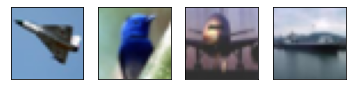

In [114]:
plot_batch(real_samples_exmaple)

In [115]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.con_layer = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=2, stride=2),
            nn.LeakyReLU(),
            #nn.Dropout(0.3),
            nn.Conv2d(64, 128, kernel_size=3, padding=2, stride=2),
            nn.LeakyReLU(),
            #nn.Dropout(0.3),
            nn.Conv2d(128, 128, kernel_size=3, padding=2, stride=2),
            nn.LeakyReLU(),
            #nn.Dropout(0.3),
            nn.Conv2d(128, 256, kernel_size=3, padding=2, stride=2),
            nn.LeakyReLU(),
            #nn.Dropout(0.3),  
        )
        
        self.linear_layer = nn.Sequential(
            nn.Flatten(),
            #nn.Dropout(0.4),
            nn.Linear(4096, 1),
            nn.Sigmoid(),
        )
        

    def forward(self, x):
        x = x.view(x.size(0), 3, 32, 32)
        x = self.con_layer(x)
        x = self.linear_layer(x)
        return x

In [116]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(128, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(128, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(),
            nn.Conv2d(128, 3, kernel_size=3),
            nn.Tanh(),
        )
        self.first = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(),
        )
        self.second = nn.Sequential(
            nn.ConvTranspose2d(128, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(),
        )
        self.third = nn.Sequential(
            nn.ConvTranspose2d(128, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(),
        )
        self.four = nn.Sequential(
            nn.Conv2d(128, 3, kernel_size=3, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = x.view(x.size(0), 256, 4, 4)
        output = self.first(x)
        #print(output.shape)
        output = self.second(output)
        #print(output.shape)
        output = self.third(output)
        #print(output.shape)
        output = self.four(output)
        #print(output.shape)
        output = output.view(x.size(0), 3, 32, 32)
        return output

In [117]:
lr = 0.0002
num_epochs = 200

discriminator = Discriminator().to(device)
generator = Generator().to(device=device)

loss_function_discriminator = nn.BCELoss()
loss_function_generator = nn.BCELoss()

optimizer_discriminator = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_generator = torch.optim.Adam(generator.parameters(), lr=lr)

Epoch: 0 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 0 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 0


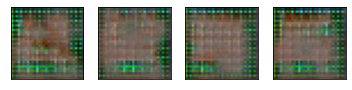

Epoch: 1 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 1 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 1


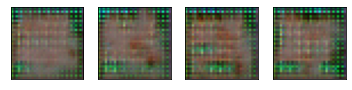

Epoch: 2 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 2 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 2


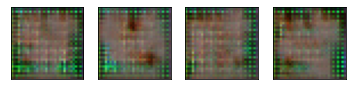

Epoch: 3 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 3 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 3


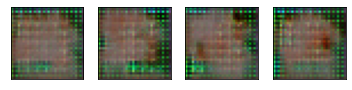

Epoch: 4 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 4 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 4


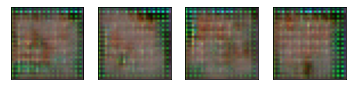

Epoch: 5 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 5 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 5


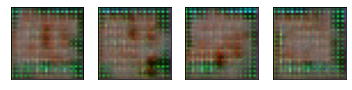

Epoch: 6 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 6 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 6


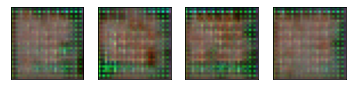

Epoch: 7 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 7 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 7


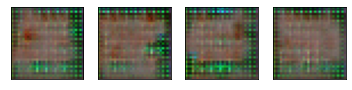

Epoch: 8 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 8 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 8


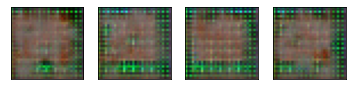

Epoch: 9 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 9 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 9


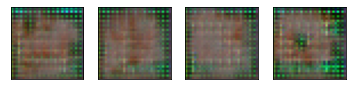

Epoch: 10 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 10 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 10


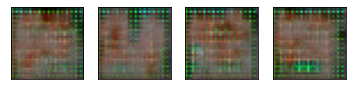

Epoch: 11 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 11 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 11


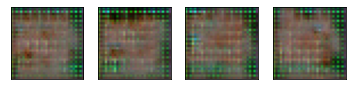

Epoch: 12 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 12 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 12


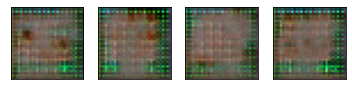

Epoch: 13 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 13 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 13


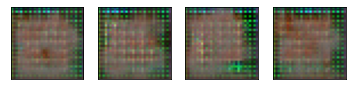

Epoch: 14 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 14 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 14


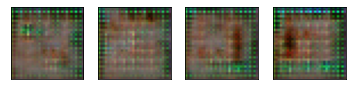

Epoch: 15 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 15 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 15


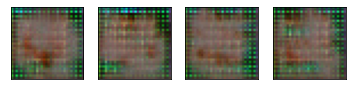

Epoch: 16 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 16 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 16


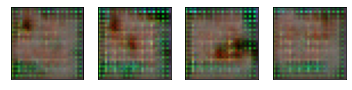

Epoch: 17 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 17 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 17


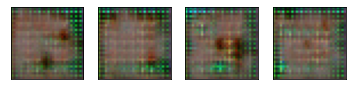

Epoch: 18 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 18 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 18


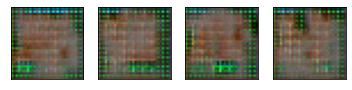

Epoch: 19 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 19 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 19


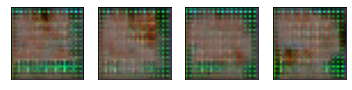

Epoch: 20 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 20 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 20


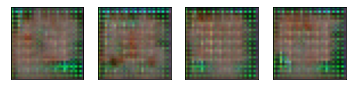

Epoch: 21 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 21 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 21


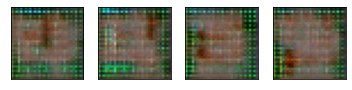

Epoch: 22 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 22 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 22


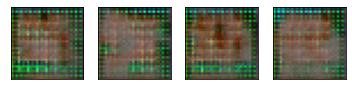

Epoch: 23 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 23 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 23


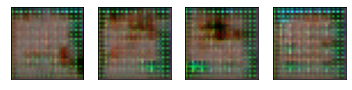

Epoch: 24 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 24 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 24


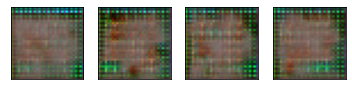

Epoch: 25 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 25 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 25


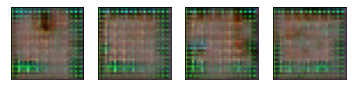

Epoch: 26 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 26 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 26


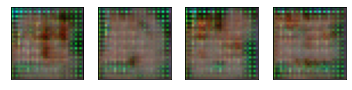

Epoch: 27 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 27 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 27


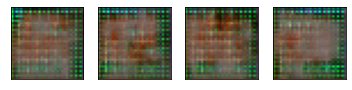

Epoch: 28 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 28 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 28


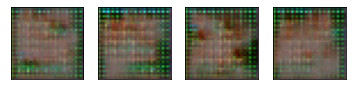

Epoch: 29 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 29 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 29


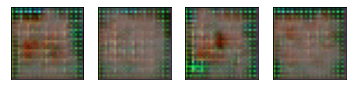

Epoch: 30 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 30 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 30


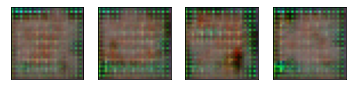

Epoch: 31 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 31 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 31


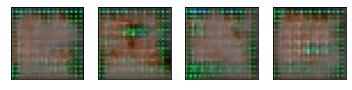

Epoch: 32 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 32 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 32


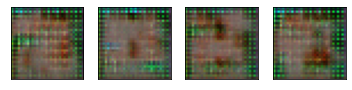

Epoch: 33 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 33 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 33


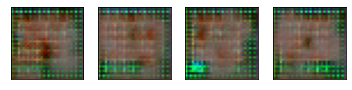

Epoch: 34 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 34 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 34


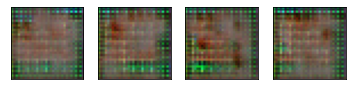

Epoch: 35 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 35 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 35


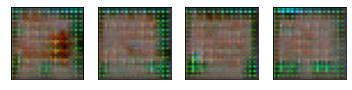

Epoch: 36 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 36 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 36


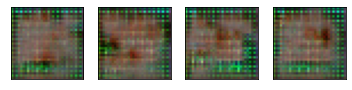

Epoch: 37 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 37 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 37


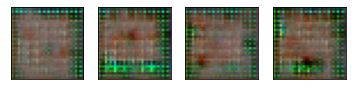

Epoch: 38 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 38 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 38


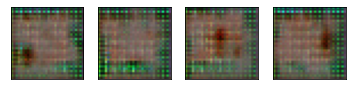

Epoch: 39 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 39 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 39


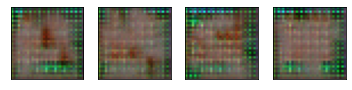

Epoch: 40 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 40 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 40


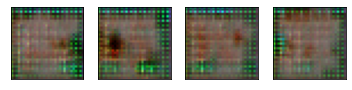

Epoch: 41 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 41 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 41


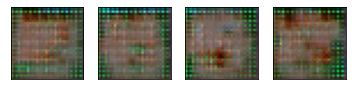

Epoch: 42 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 42 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 42


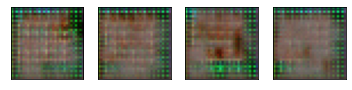

Epoch: 43 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 43 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 43


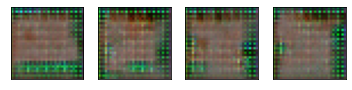

Epoch: 44 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 44 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 44


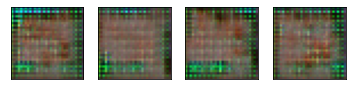

Epoch: 45 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 45 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 45


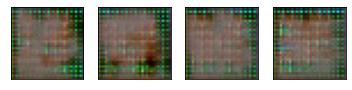

Epoch: 46 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 46 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 46


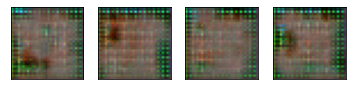

Epoch: 47 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 47 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 47


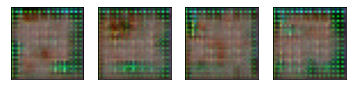

Epoch: 48 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 48 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 48


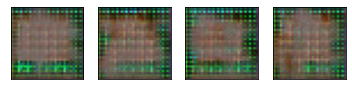

Epoch: 49 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 49 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 49


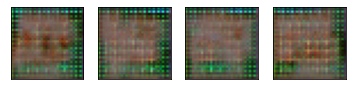

Epoch: 50 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 50 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 50


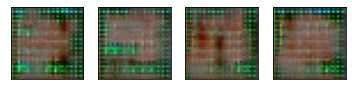

Epoch: 51 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 51 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 51


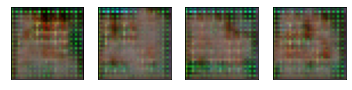

Epoch: 52 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 52 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 52


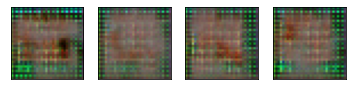

Epoch: 53 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 53 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 53


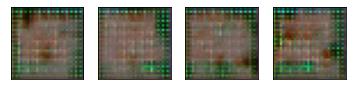

Epoch: 54 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 54 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 54


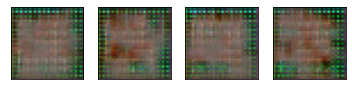

Epoch: 55 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 55 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 55


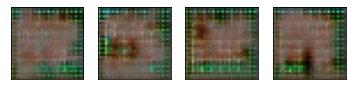

Epoch: 56 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 56 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 56


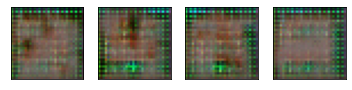

Epoch: 57 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 57 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 57


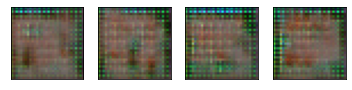

Epoch: 58 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 58 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 58


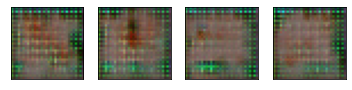

Epoch: 59 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 59 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 59


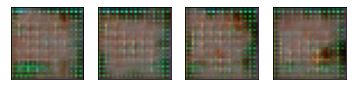

Epoch: 60 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 60 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 60


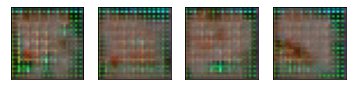

Epoch: 61 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 61 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 61


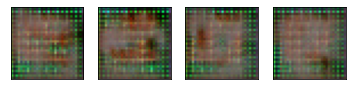

Epoch: 62 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 62 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 62


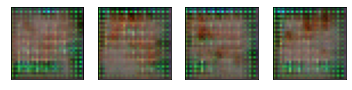

Epoch: 63 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 63 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 63


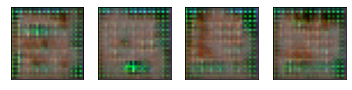

Epoch: 64 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 64 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 64


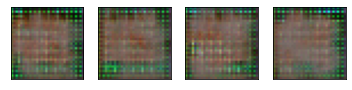

Epoch: 65 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 65 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 65


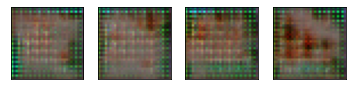

Epoch: 66 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 66 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 66


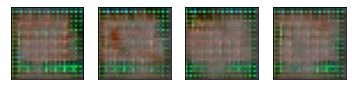

Epoch: 67 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 67 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 67


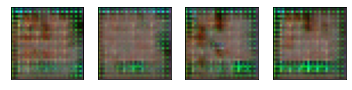

Epoch: 68 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 68 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 68


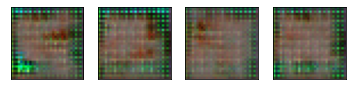

Epoch: 69 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 69 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 69


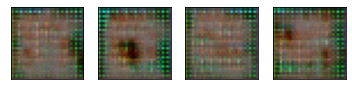

Epoch: 70 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 70 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 70


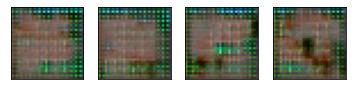

Epoch: 71 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 71 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 71


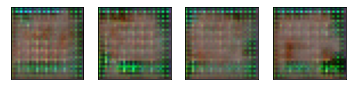

Epoch: 72 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 72 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 72


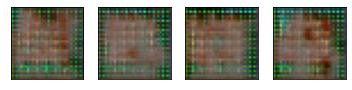

Epoch: 73 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 73 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 73


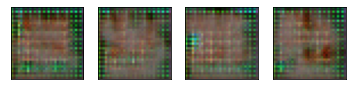

Epoch: 74 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 74 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 74


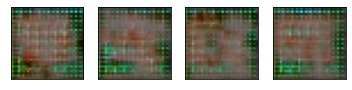

Epoch: 75 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 75 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 75


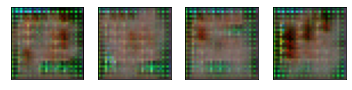

Epoch: 76 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 76 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 76


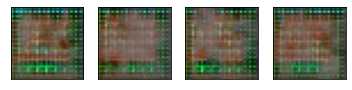

Epoch: 77 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 77 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 77


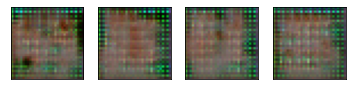

Epoch: 78 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 78 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 78


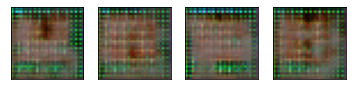

Epoch: 79 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 79 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 79


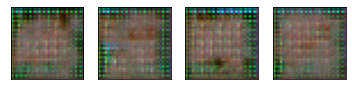

Epoch: 80 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 80 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 80


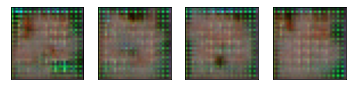

Epoch: 81 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 81 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 81


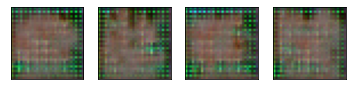

Epoch: 82 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 82 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 82


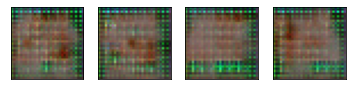

Epoch: 83 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 83 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 83


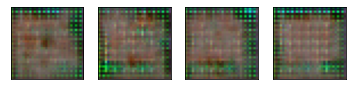

Epoch: 84 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 84 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 84


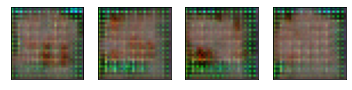

Epoch: 85 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 85 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 85


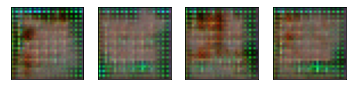

Epoch: 86 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 86 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 86


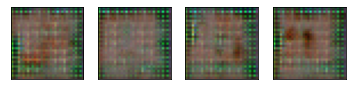

Epoch: 87 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 87 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 87


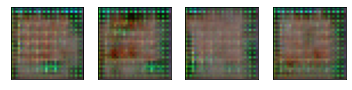

Epoch: 88 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 88 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 88


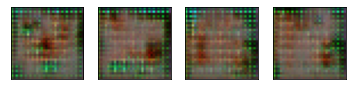

Epoch: 89 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 89 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 89


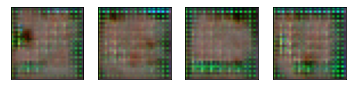

Epoch: 90 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 90 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 90


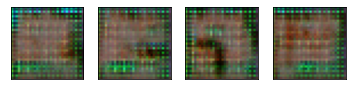

Epoch: 91 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 91 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 91


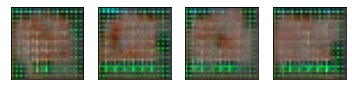

Epoch: 92 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 92 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 92


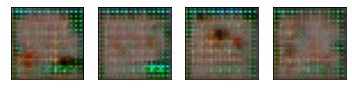

Epoch: 93 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 93 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 93


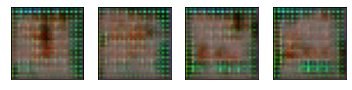

Epoch: 94 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 94 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 94


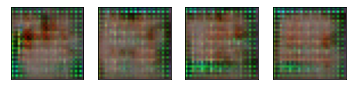

Epoch: 95 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 95 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 95


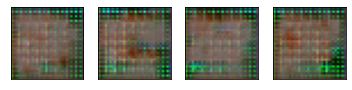

Epoch: 96 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 96 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 96


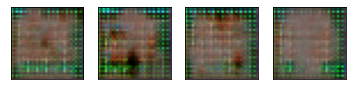

Epoch: 97 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 97 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 97


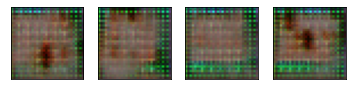

Epoch: 98 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 98 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 98


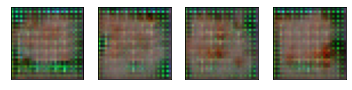

Epoch: 99 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 99 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 99


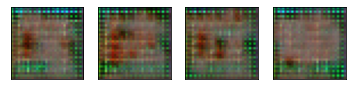

Epoch: 100 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 100 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 100


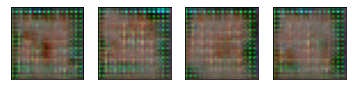

Epoch: 101 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 101 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 101


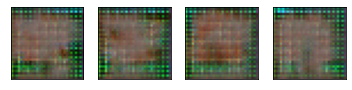

Epoch: 102 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 102 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 102


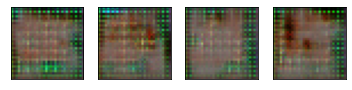

Epoch: 103 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 103 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 103


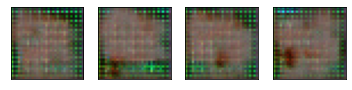

Epoch: 104 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 104 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 104


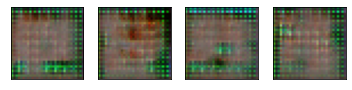

Epoch: 105 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 105 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 105


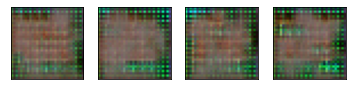

Epoch: 106 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 106 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 106


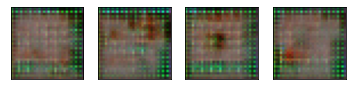

Epoch: 107 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 107 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 107


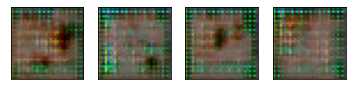

Epoch: 108 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 108 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 108


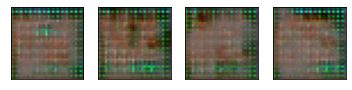

Epoch: 109 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 109 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 109


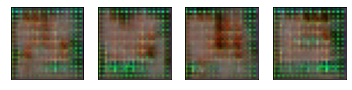

Epoch: 110 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 110 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 110


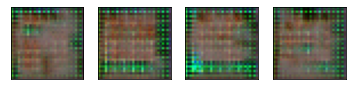

Epoch: 111 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 111 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 111


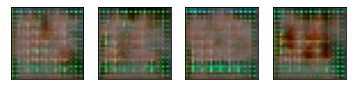

Epoch: 112 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 112 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 112


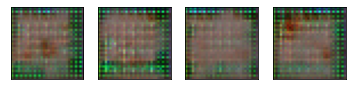

Epoch: 113 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 113 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 113


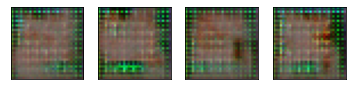

Epoch: 114 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 114 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 114


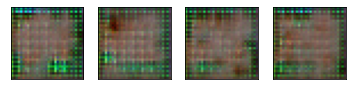

Epoch: 115 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 115 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 115


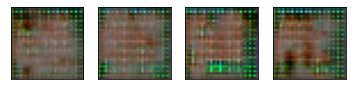

Epoch: 116 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 116 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 116


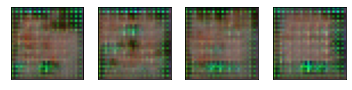

Epoch: 117 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 117 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 117


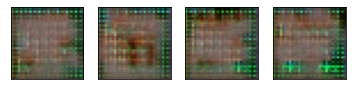

Epoch: 118 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 118 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 118


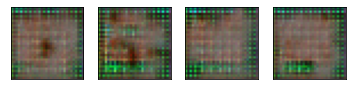

Epoch: 119 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 119 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 119


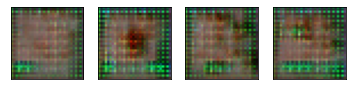

Epoch: 120 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 120 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 120


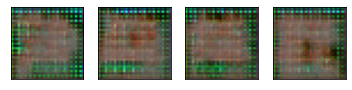

Epoch: 121 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 121 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 121


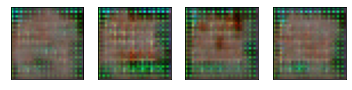

Epoch: 122 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 122 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 122


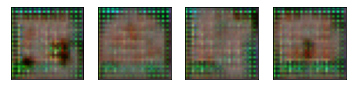

Epoch: 123 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 123 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 123


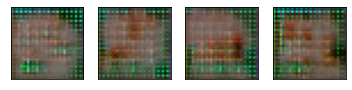

Epoch: 124 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 124 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 124


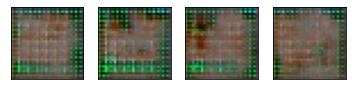

Epoch: 125 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 125 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 125


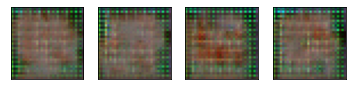

Epoch: 126 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 126 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 126


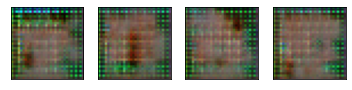

Epoch: 127 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 127 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 127


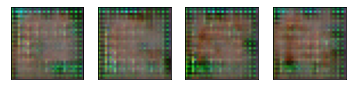

Epoch: 128 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 128 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 128


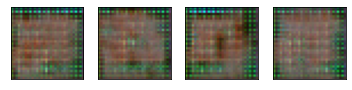

Epoch: 129 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 129 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 129


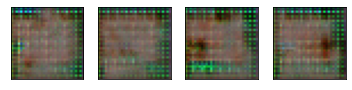

Epoch: 130 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 130 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 130


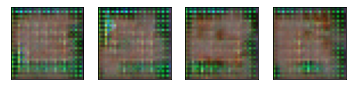

Epoch: 131 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 131 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 131


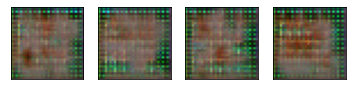

Epoch: 132 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 132 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 132


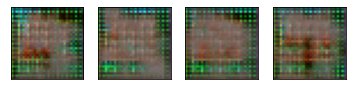

Epoch: 133 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 133 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 133


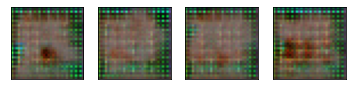

Epoch: 134 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 134 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 134


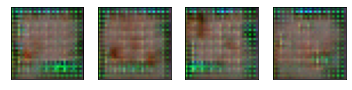

Epoch: 135 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 135 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 135


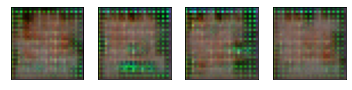

Epoch: 136 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 136 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 136


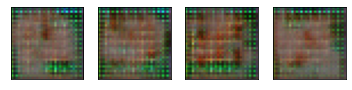

Epoch: 137 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 137 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 137


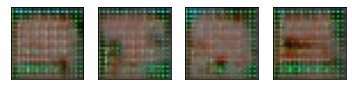

Epoch: 138 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 138 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 138


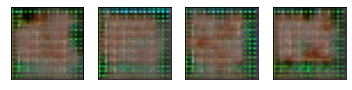

Epoch: 139 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 139 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 139


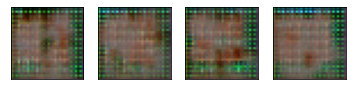

Epoch: 140 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 140 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 140


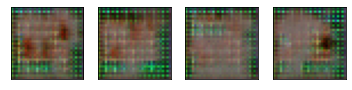

Epoch: 141 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 141 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 141


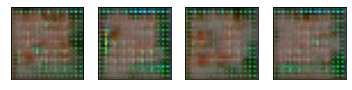

Epoch: 142 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 142 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 142


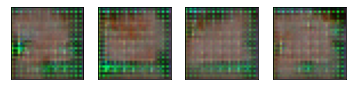

Epoch: 143 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 143 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 143


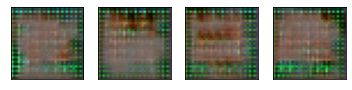

Epoch: 144 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 144 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 144


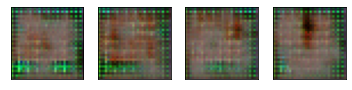

Epoch: 145 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 145 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 145


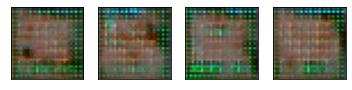

Epoch: 146 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 146 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 146


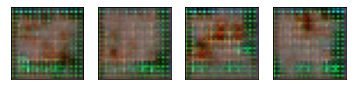

Epoch: 147 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 147 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 147


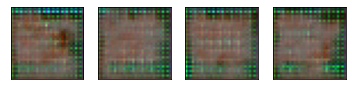

Epoch: 148 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 148 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 148


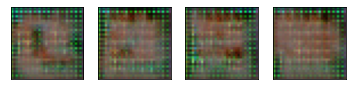

Epoch: 149 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 149 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 149


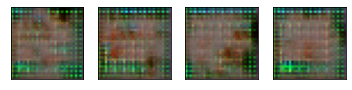

Epoch: 150 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 150 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 150


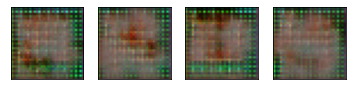

Epoch: 151 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 151 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 151


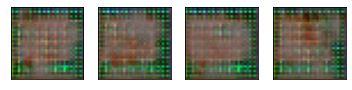

Epoch: 152 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 152 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 152


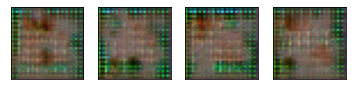

Epoch: 153 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 153 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 153


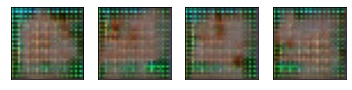

Epoch: 154 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 154 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 154


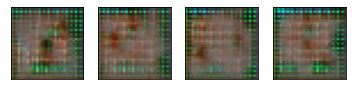

Epoch: 155 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 155 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 155


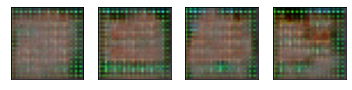

Epoch: 156 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 156 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 156


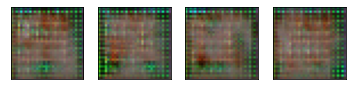

Epoch: 157 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 157 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 157


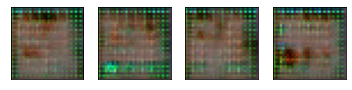

Epoch: 158 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 158 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 158


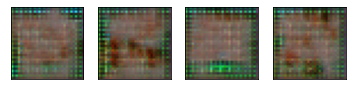

Epoch: 159 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 159 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 159


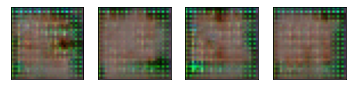

Epoch: 160 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 160 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 160


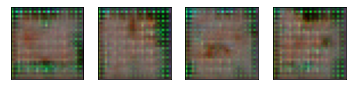

Epoch: 161 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 161 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 161


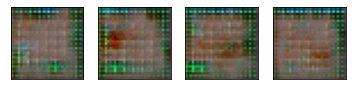

Epoch: 162 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 162 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 162


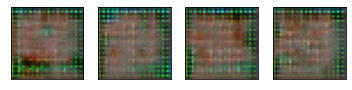

Epoch: 163 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 163 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 163


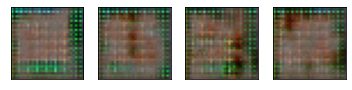

Epoch: 164 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 164 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 164


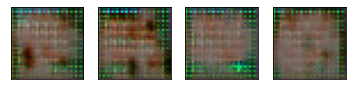

Epoch: 165 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 165 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 165


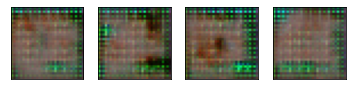

Epoch: 166 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 166 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 166


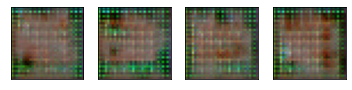

Epoch: 167 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 167 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 167


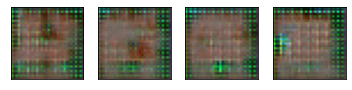

Epoch: 168 Loss D.: 1250000.0 Average Loss D.: 50.0
Epoch: 168 Loss G.: 0.0 Average Loss G.: 0.0
Epoch: 168


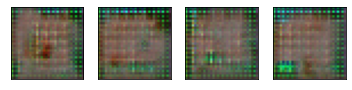

KeyboardInterrupt: 

In [120]:
for epoch in range(num_epochs):
    
    running_loss_d = 0.0
    running_loss_g = 0.0

    for n, (real_samples, labels) in enumerate(train_loader):
        
        loss_d = 0
        loss_g = 0
        
        # train discriminator on real
        real_samples = real_samples.to(device=device)
        real_samples_labels = torch.ones((batch_size, 1)).to(device=device)
        
        discriminator.zero_grad()
        output_discriminator = discriminator(real_samples)
        loss_discriminator = loss_function_discriminator(output_discriminator, real_samples_labels)
        loss_discriminator.backward() 
        running_loss_d += loss_discriminator.item()
        
        # train discriminator on fake
        latent_space_samples = torch.randn((batch_size, 4096)).to(device=device)
        generated_samples = generator(latent_space_samples)
        generated_samples_labels = torch.zeros((batch_size, 1)).to(device=device)
        
        discriminator.zero_grad()
        output_discriminator = discriminator(generated_samples)
        loss_discriminator = loss_function_discriminator(output_discriminator, generated_samples_labels)
        loss_discriminator.backward()
        running_loss_d += loss_discriminator.item()
        
        optimizer_discriminator.step()    

        # train generator
        latent_space_samples = torch.rand((batch_size, 4096))
        latent_space_samples = latent_space_samples * 2 - 1 # 0,1 to -1,1
        latent_space_samples = latent_space_samples.to(device)
        inverted_labels = torch.ones((batch_size, 1)).to(device=device)

        generator.zero_grad()
        generated_samples = generator(latent_space_samples)
        output_discriminator_generated = discriminator(generated_samples)
        loss_generator = loss_function_generator(output_discriminator_generated, inverted_labels)
        loss_generator.backward()
        optimizer_generator.step()
        
        running_loss_g += loss_generator.item()
        
        # Show loss
        if n == (len(train_loader) - 1):
            bat_per_epo = int(len(train_set) / batch_size)
            print(f"Epoch: {epoch} Loss D.: {running_loss_d} Average Loss D.: {running_loss_d / (bat_per_epo * 2)}")
            print(f"Epoch: {epoch} Loss G.: {running_loss_g} Average Loss G.: {running_loss_g / bat_per_epo}")
            print(f"Epoch: {epoch}")
            generated_samples = generated_samples.cpu().detach()
            plot_batch(generated_samples)
        
            #img_grid = torchvision.utils.make_grid(generated_samples)
            #writer.add_image('generated', img_grid)
            

In [62]:
if epoch % 5 == 0 or True:
    # evaluate model:
    generator.eval()
    discriminator.eval()

    with torch.no_grad():
        acc = 0
        predicted_labels = (output_discriminator > 0.5).float()
        acc += ((predicted_labels == all_samples_labels).sum() / float(all_samples_labels.shape[0]))
        print("Epoch {}/{}, Discriminator Accuracy: {:.3f}".format(epoch+1, num_epochs, acc))

    generator.train()    
    discriminator.train()

NameError: name 'output_discriminator' is not defined

In [ ]:
latent_space_samples = torch.randn(batch_size, 4096).to(device=device)
generated_samples = generator(latent_space_samples)
generated_samples = generated_samples.cpu().detach()

plot_batch(generated_samples)

In [ ]:
latent_space_samples = torch.randn(batch_size, 4096).to(device=device)
generated_samples = generator(latent_space_samples)
generated_samples = generated_samples.cpu().detach()
for i in range(batch_size):
    ax = plt.subplot(4, 8, i + 1)
    generated_samples[i] = generated_samples[i] / 2 + 0.5
    plt.imshow(np.transpose(generated_samples[i].reshape(3, 32, 32), (1, 2, 0)))
    plt.xticks([])
    plt.yticks([])

In [ ]:
y = discriminator(generated_samples.to(device))
print(y)